Egg Detection with DETR_Custom Dataset


In [28]:
# Importing libraries
from PIL import Image
import matplotlib.pyplot as plt
import os
import glob


import torch
import torchvision.transforms as T
import torchvision
from models import build_model

In [29]:
# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

CLASSES = [
    'None',
    'Normal',
    'Blood Spot',
    'Crack',
    'Bleached',
    'Impurity',
    'Deformity'
]

In [30]:
# Create arguments class for build DETR model
class Args:
    lr_backbone = 2e-4
    masks = None
    # Model parameters
    frozen_weights = None
    backbone = 'resnet50'
    dilation = False
    position_embedding = 'sine'
    enc_layers = 6
    dec_layers = 6
    dim_feedforward = 2048
    hidden_dim = 256
    dropout = 0.1
    nheads = 8
    num_queries = 100
    pre_norm = False
    aux_loss = False
    num_classes = 6
    set_cost_class=1
    set_cost_bbox=5
    set_cost_giou=2
    mask_loss_coef=1
    dice_loss_coef=1
    bbox_loss_coef=5
    giou_loss_coef=2
    eos_coef=0.1
    num_bbox_reg_classes = 2
    # Dataset parameters
    dataset_file = 'coco'
    coco_path = '../MONO_COCO'
    remove_difficult = False
    coco_panoptic_path = None
    # Device parameters
    device = 'cuda'
    seed = 42
    # Misc
    output_dir = ''
    resume = './outputs_mono/DETR_best_mono.pth' # Path to load weights model


args = Args()

In [31]:
# Preprocess image - Get list of images
def collect_all_images(dir_test):
    """
    Function to return a list of image paths.

    :param dir_test: Directory containing images or single image path.

    Returns:
        test_images: List containing all image paths.
    """
    test_images = []
    if os.path.isdir(dir_test):
        image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm']
        for file_type in image_file_types:
            test_images.extend(glob.glob(f"{dir_test}/{file_type}"))
    else:
        test_images.append(dir_test)
    return test_images   

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_min, y_min, w, h = x.unbind(1)
    b = [x_min - 0.5 * w, y_min - 0.5 * h, x_min + 0.5 * w, y_min + 0.5 * h]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [40]:
# Compute distance between two points (x1, y1) and (x2, y2)
def distance(x, y):
    return ((x[0] - y[0])**2 + (x[1] - y[1])**2)**0.5

# Put everything on detect function
def detect(im, model, transform):
    # mean-std normalize the input image (batch-size: 1)
    img = transform(im).unsqueeze(0)

    # demo model only support by default images with aspect ratio between 0.5 and 2
    # if you want to use images with an aspect ratio outside this range
    # rescale your image so that the maximum size is at most 1333 for best results
    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600, 'demo model only supports images up to 1600 pixels on each side'

    # propagate through the model
    outputs = model(img)
    #print(outputs)
    print(type(outputs))

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.7

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    #bboxes_scaled = bboxes_scaled.tolist()

    return probas[keep], bboxes_scaled

def Select_Bounding_Boxes(probas, bboxes_scaled):

    # Finding the center coordinates of the bounding box
    center_x = (bboxes_scaled[:, 0] + bboxes_scaled[:, 2]) / 2
    center_y = (bboxes_scaled[:, 1] + bboxes_scaled[:, 3]) / 2

    # Combine center_x and center_y to get the center coordinates
    center = torch.stack((center_x, center_y), dim=1)
    center = center.tolist()
    print(center)

    # Remove the center coordinates that are too close to each other
    dist = 0
    index_remove = []
    for i in range(len(center)):
        for j in range(i + 1, len(center)):
            dist = distance(center[i], center[j])
            if dist < 50:
                # Remove the center with the lower confidence
                if probas[i].max() > probas[j].max():
                    index_remove.append(j)
                else:
                    index_remove.append(i)

    print(index_remove)

    bboxes_scaled = bboxes_scaled.tolist()
    probas = probas.tolist()

    # Delete bounding boxes having index in index_remove
    # Sort index_remove in descending order
    index_remove.sort(reverse=True)
    for i in index_remove:
        del bboxes_scaled[i]
        del probas[i]
    
    # Convert list to tensor
    probas = torch.tensor(probas)
    return probas, bboxes_scaled


def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    pil_img = plt.imread(pil_img)
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes, COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

Detecting Eggs with DETR - DEMO with a Single Color Image


<class 'dict'>
Number bounding boxes before:  11
[[805.3260498046875, 891.9569091796875], [1036.174560546875, 878.064208984375], [318.53985595703125, 889.1987915039062], [567.08349609375, 522.1229858398438], [567.6070556640625, 882.5418090820312], [324.6469421386719, 157.20680236816406], [806.800537109375, 891.3516235351562], [567.3761596679688, 523.1663208007812], [318.9317932128906, 888.0068969726562], [809.6278076171875, 524.4967651367188], [320.4960632324219, 522.4879760742188]]
[0, 8, 3]
Number bounding boxes after:  8


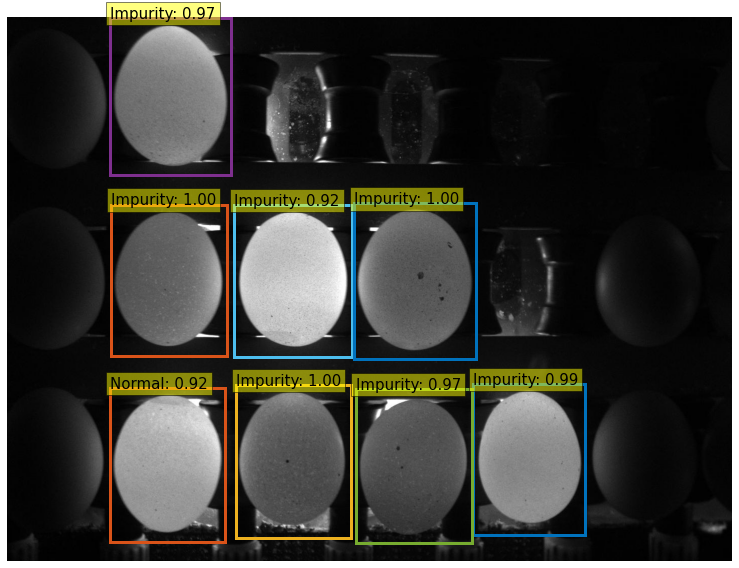

In [44]:
# Load model
model, criterion, postprocessors = build_model(args)
checkpoint = torch.load(args.resume, map_location='cpu')
model.load_state_dict(checkpoint['model'], strict=False)

# Inference phase visualization
image = './Final_MONO_Images_Demo/0604090017_1_03891.jpg'
img = Image.open(image)
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


scores, boxes = detect(img, model, transform)
print('Number bounding boxes before: ', len(boxes))
scores_1, boxes_1 = Select_Bounding_Boxes(scores, boxes)
print('Number bounding boxes after: ', len(boxes_1))
plot_results(image, scores_1, boxes_1)


Detecting Eggs with DETR - DEMO with Multiple Color Images

./Final_MONO_Images_Demo/0609093321_0_00709.jpg
<class 'dict'>
Number bounding boxes before:  8
[[767.563720703125, 226.78298950195312], [761.9666748046875, 894.018310546875], [284.3257141113281, 893.8388671875], [1003.4088134765625, 883.6307373046875], [1009.5902709960938, 226.0057373046875], [283.8793640136719, 228.34921264648438], [282.7933654785156, 563.9966430664062], [1008.7996826171875, 226.12843322753906]]
[4]
Number bounding boxes after:  7


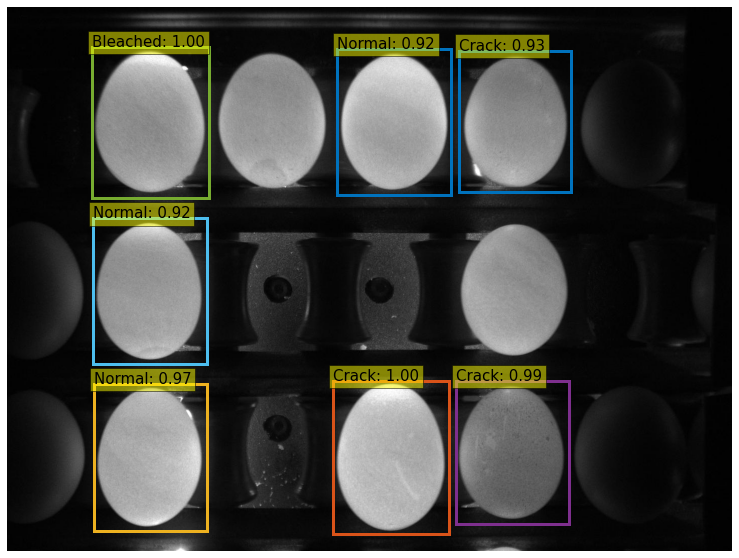

./Final_MONO_Images_Demo/0604095417_0_03052.jpg
<class 'dict'>
Number bounding boxes before:  8
[[1000.515625, 888.016845703125], [281.5130310058594, 227.54495239257812], [1004.794189453125, 557.922119140625], [1007.6058349609375, 228.28720092773438], [521.2410278320312, 558.5662841796875], [524.1763916015625, 225.70565795898438], [279.4052734375, 562.4786376953125], [281.8557434082031, 226.64938354492188]]
[7]
Number bounding boxes after:  7


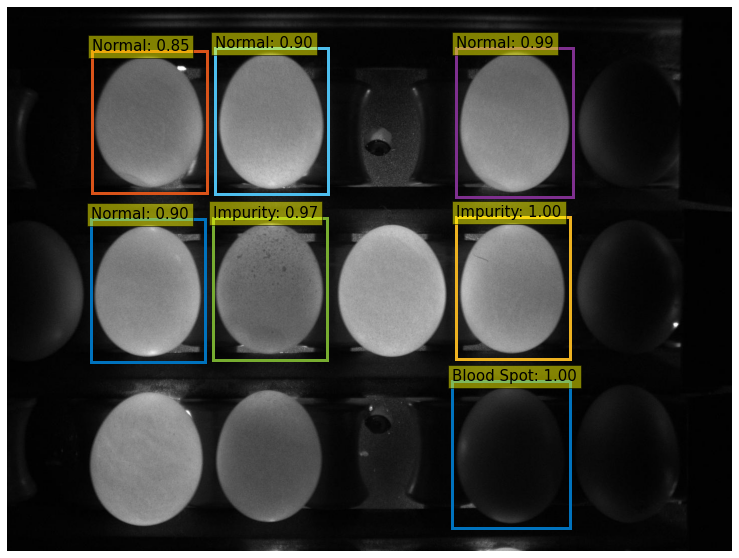

./Final_MONO_Images_Demo/0718115927_0_10051_101.jpg
<class 'dict'>
Number bounding boxes before:  12
[[515.2229614257812, 229.80374145507812], [1000.6470947265625, 889.7084350585938], [760.3965454101562, 226.0198516845703], [998.2890014648438, 228.74093627929688], [1000.314697265625, 564.6768798828125], [512.7366333007812, 896.378662109375], [275.4727783203125, 230.71827697753906], [756.2003173828125, 894.118896484375], [512.9452514648438, 566.5550537109375], [271.52496337890625, 899.032958984375], [758.562255859375, 560.63720703125], [275.3541564941406, 568.77978515625]]
[]
Number bounding boxes after:  12


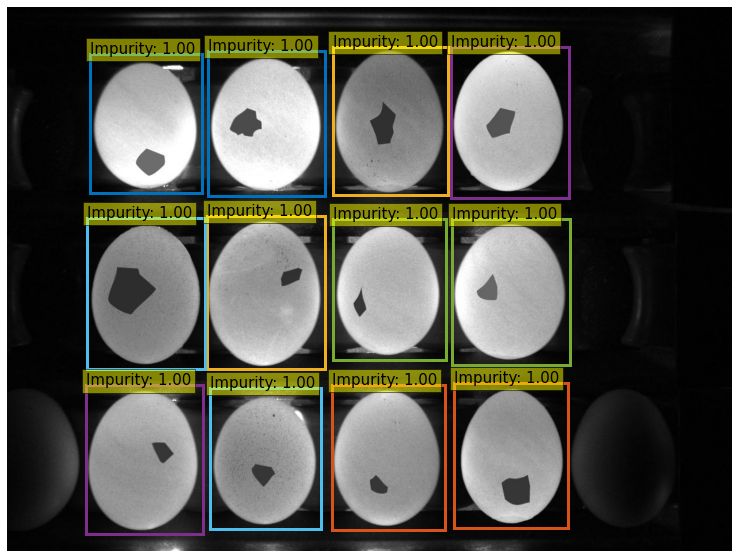

./Final_MONO_Images_Demo/0604093435_0_06171.jpg
<class 'dict'>
Number bounding boxes before:  3
[[1106.0693359375, 542.0825805664062], [616.6317138671875, 900.3350830078125], [618.2268676757812, 541.7244873046875]]
[]
Number bounding boxes after:  3


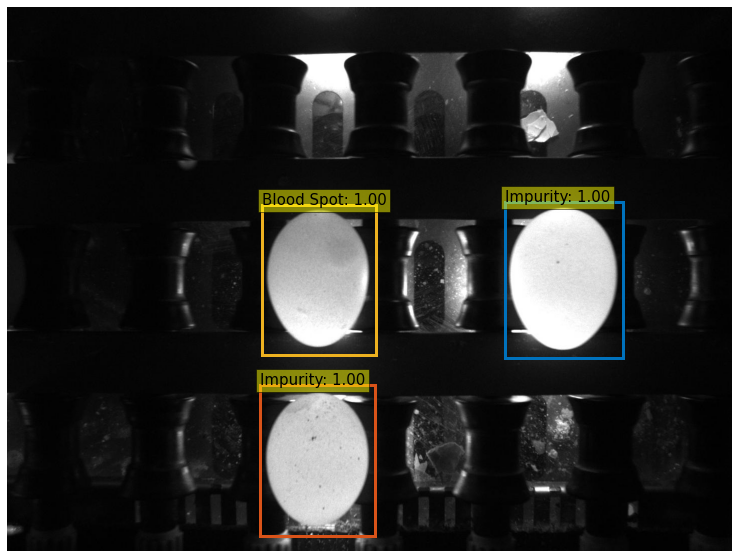

./Final_MONO_Images_Demo/0604095607_1_07644.jpg
<class 'dict'>
Number bounding boxes before:  9
[[570.706787109375, 164.72926330566406], [1032.4342041015625, 877.415283203125], [1032.5367431640625, 877.6400146484375], [799.5377197265625, 885.4973754882812], [564.0746459960938, 885.3447265625], [801.9017944335938, 884.2080078125], [567.7186279296875, 524.89013671875], [318.556396484375, 885.7998046875], [320.3214416503906, 522.4429931640625]]
[2, 3]
Number bounding boxes after:  7


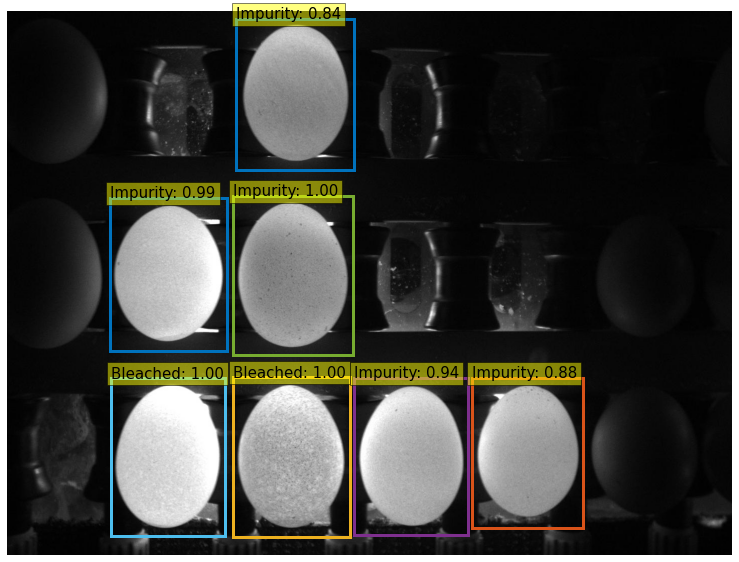

./Final_MONO_Images_Demo/0604093540_1_01646.jpg
<class 'dict'>
Number bounding boxes before:  9
[[679.9982299804688, 881.0521240234375], [445.5440673828125, 877.1981201171875], [922.4580078125, 881.9532470703125], [928.0286254882812, 222.54983520507812], [1162.5269775390625, 556.8624267578125], [684.9842529296875, 551.4998779296875], [924.38134765625, 553.5776977539062], [689.9488525390625, 223.62075805664062], [1162.82958984375, 557.0587158203125]]
[8]
Number bounding boxes after:  8


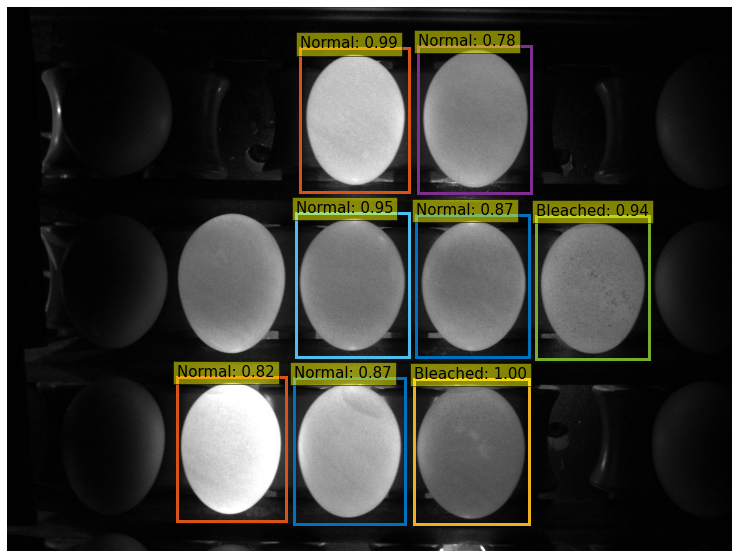

./Final_MONO_Images_Demo/0718115500_0_09715.jpg
<class 'dict'>
Number bounding boxes before:  12
[[509.794921875, 891.1549072265625], [754.400634765625, 221.779296875], [263.81671142578125, 896.4317626953125], [270.700439453125, 228.22059631347656], [748.4124145507812, 888.9347534179688], [997.702880859375, 228.92068481445312], [512.5924682617188, 564.1107177734375], [752.4151611328125, 560.5089111328125], [511.7140808105469, 222.2966766357422], [993.0699462890625, 560.5728759765625], [264.1302490234375, 563.9232177734375], [989.7777099609375, 883.24853515625]]
[]
Number bounding boxes after:  12


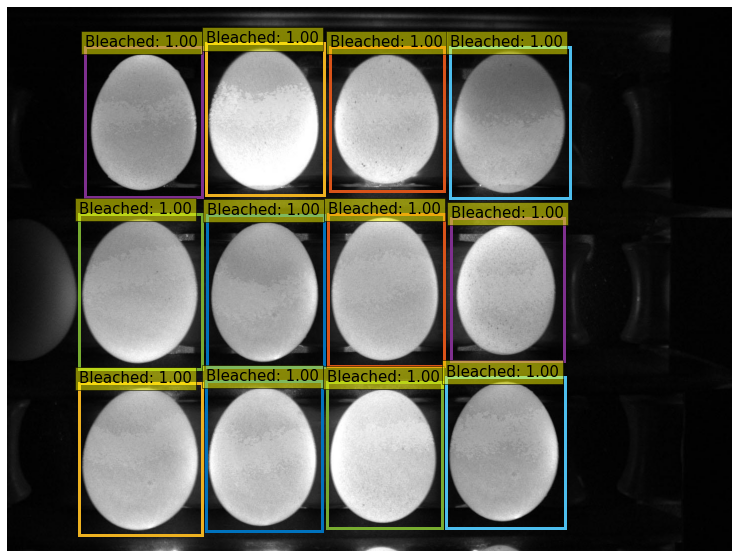

./Final_MONO_Images_Demo/0718114751_0_09176_4.jpg
<class 'dict'>
Number bounding boxes before:  12
[[513.8858642578125, 228.20751953125], [999.9521484375, 884.861083984375], [757.3386840820312, 224.31478881835938], [989.9490356445312, 227.83265686035156], [996.0188598632812, 559.0855102539062], [510.69110107421875, 901.279541015625], [270.6512451171875, 228.4773406982422], [758.845458984375, 893.6134033203125], [510.3383483886719, 570.0499267578125], [268.5009765625, 902.89892578125], [756.2216186523438, 561.7149658203125], [270.99737548828125, 572.6119384765625]]
[]
Number bounding boxes after:  12


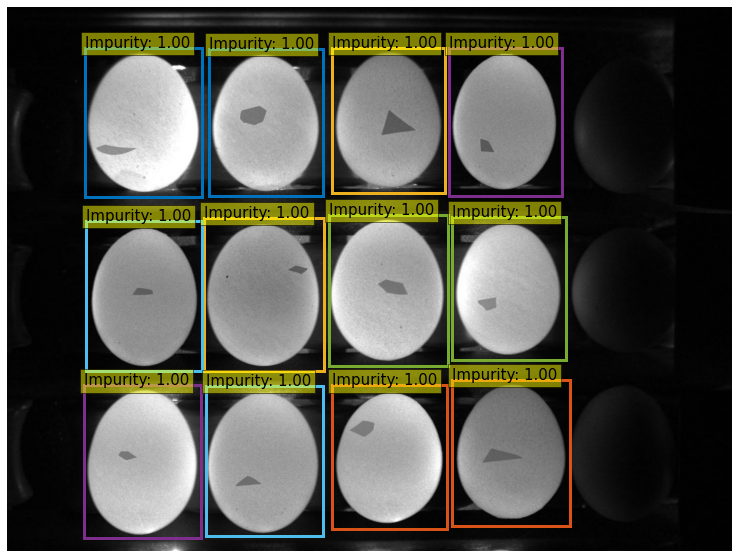

./Final_MONO_Images_Demo/0604093106_0_01302.jpg
<class 'dict'>
Number bounding boxes before:  8
[[520.5908203125, 889.603271484375], [284.5583801269531, 227.4672088623047], [760.7579956054688, 887.540771484375], [763.6962280273438, 557.60498046875], [1004.0897216796875, 556.1107788085938], [280.79656982421875, 560.9326171875], [280.9085693359375, 894.1452026367188], [763.5057373046875, 557.4902954101562]]
[3]
Number bounding boxes after:  7


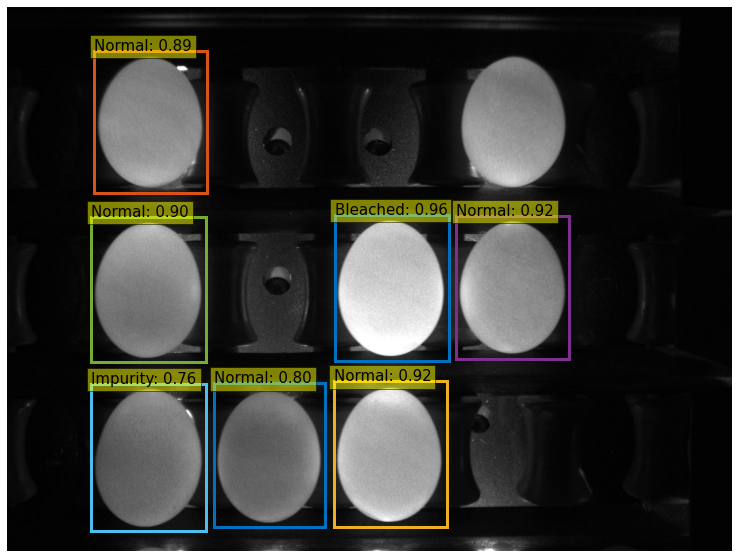

./Final_MONO_Images_Demo/0604093110_1_05931.jpg
<class 'dict'>
Number bounding boxes before:  10
[[565.6174926757812, 885.33642578125], [1034.7744140625, 883.9735107421875], [1035.1051025390625, 529.5677490234375], [566.4788818359375, 524.9159545898438], [564.3505249023438, 884.81494140625], [326.898193359375, 160.56272888183594], [803.0618896484375, 882.5690307617188], [318.594970703125, 892.137451171875], [321.7298278808594, 526.7590942382812], [1034.3980712890625, 884.5487670898438]]
[4, 1]
Number bounding boxes after:  8


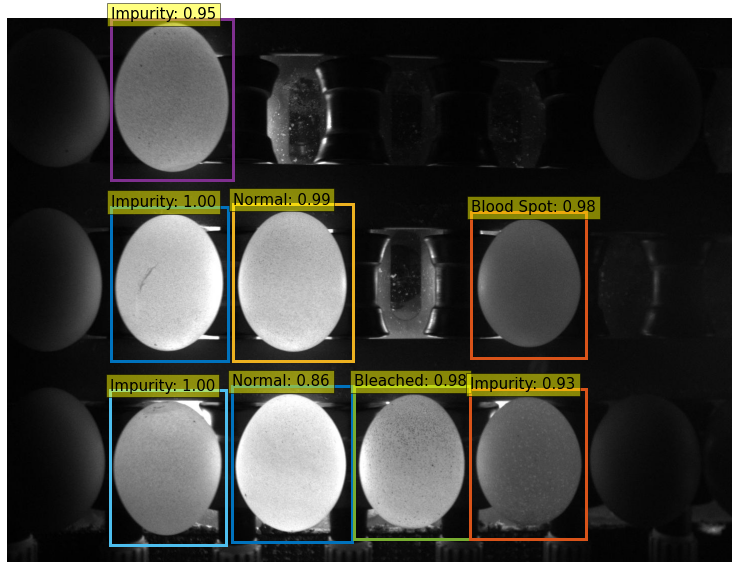

./Final_MONO_Images_Demo/0604092436_1_05469.jpg
<class 'dict'>
Number bounding boxes before:  14
[[566.3673095703125, 886.7431640625], [570.6903686523438, 161.98577880859375], [317.8833312988281, 884.4713134765625], [1045.2958984375, 525.1150512695312], [809.542724609375, 167.0802001953125], [1044.938720703125, 174.94273376464844], [568.4213256835938, 520.8579711914062], [570.6337280273438, 161.1128387451172], [325.4417724609375, 161.07754516601562], [803.7847290039062, 882.7274169921875], [570.47509765625, 162.30941772460938], [806.3217163085938, 523.1636962890625], [318.5764465332031, 521.3803100585938], [1037.9732666015625, 880.5441284179688]]
[1, 1, 7]
Number bounding boxes after:  11


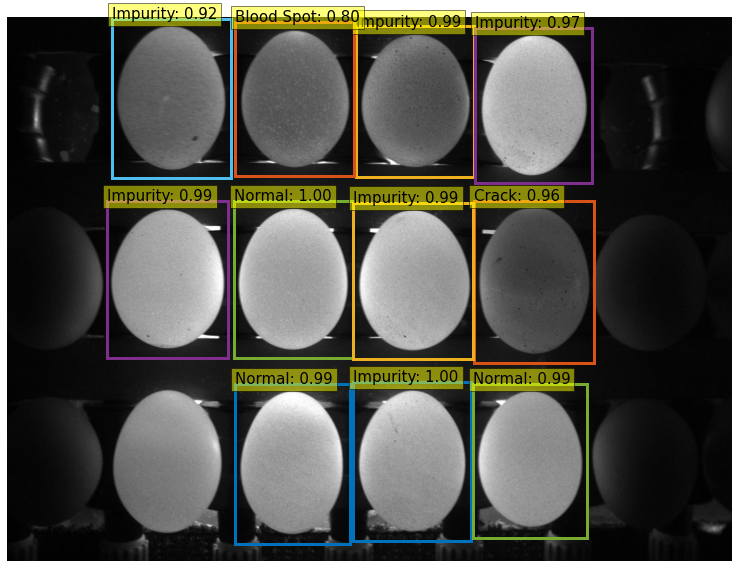

./Final_MONO_Images_Demo/0604094450_1_02338.jpg
<class 'dict'>
Number bounding boxes before:  11
[[680.7388916015625, 229.77684020996094], [1150.038818359375, 891.1231689453125], [436.44940185546875, 885.5811767578125], [444.3122863769531, 223.64956665039062], [919.6705932617188, 230.0537109375], [912.1982421875, 890.3388671875], [916.1751708984375, 558.073486328125], [676.3980712890625, 562.83056640625], [1159.3270263671875, 557.2913208007812], [435.64056396484375, 562.6810302734375], [1160.590576171875, 233.61846923828125]]
[]
Number bounding boxes after:  11


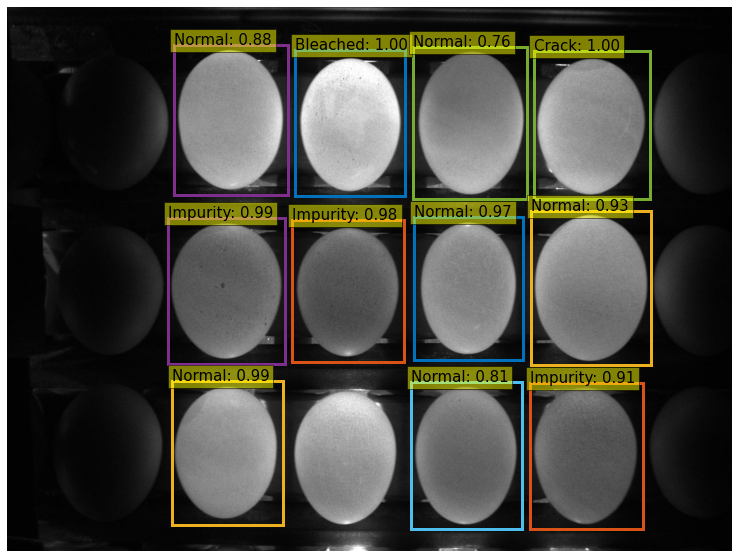

./Final_MONO_Images_Demo/0609094125_1_01317.jpg
<class 'dict'>
Number bounding boxes before:  8
[[671.9696044921875, 893.473388671875], [1149.1534423828125, 890.8060302734375], [1153.945068359375, 238.4051513671875], [918.4696044921875, 233.35516357421875], [678.0247802734375, 233.85435485839844], [916.3642578125, 566.13134765625], [433.8807067871094, 891.3816528320312], [919.210205078125, 233.05714416503906]]
[3]
Number bounding boxes after:  7


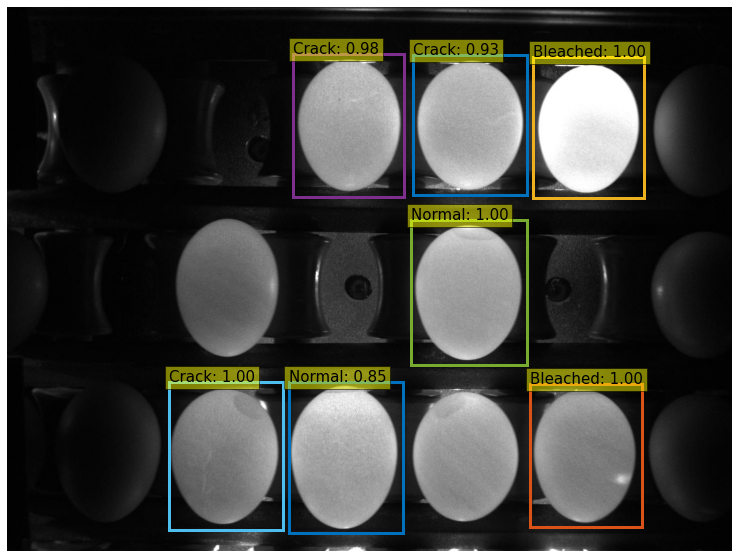

./Final_MONO_Images_Demo/0609092747_0_00288.jpg
<class 'dict'>
Number bounding boxes before:  10
[[525.2732543945312, 218.16403198242188], [1003.956298828125, 886.0973510742188], [761.71044921875, 889.2255859375], [764.1832275390625, 559.5345458984375], [1007.9283447265625, 223.59335327148438], [521.857177734375, 886.3028564453125], [764.288818359375, 559.3712158203125], [283.4255065917969, 222.47434997558594], [281.83734130859375, 884.8650512695312], [281.7087097167969, 555.5740966796875]]
[6]
Number bounding boxes after:  9


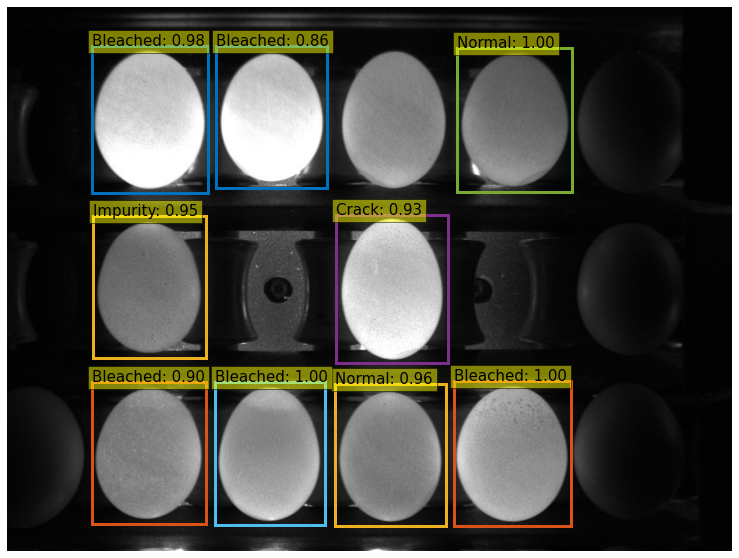

./Final_MONO_Images_Demo/0604094129_1_02085.jpg
<class 'dict'>
Number bounding boxes before:  5
[[673.0552368164062, 888.8012084960938], [680.42529296875, 229.646728515625], [913.9405517578125, 891.7142333984375], [920.1553955078125, 237.73614501953125], [1151.896240234375, 892.8428955078125]]
[]
Number bounding boxes after:  5


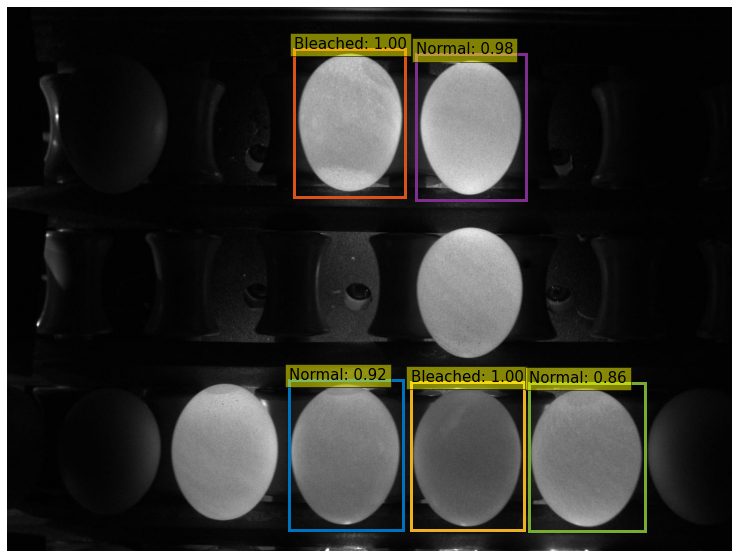

./Final_MONO_Images_Demo/0604095026_1_02761.jpg
<class 'dict'>
Number bounding boxes before:  11
[[675.3187255859375, 882.6197509765625], [680.3890991210938, 230.9405059814453], [433.38702392578125, 883.0330810546875], [1154.76708984375, 558.1639404296875], [676.306640625, 560.067626953125], [436.1459045410156, 556.4585571289062], [1157.11328125, 233.7792205810547], [675.22119140625, 881.9561157226562], [918.1304931640625, 556.6785278320312], [443.5101318359375, 231.47842407226562], [1150.828369140625, 888.840087890625]]
[0]
Number bounding boxes after:  10


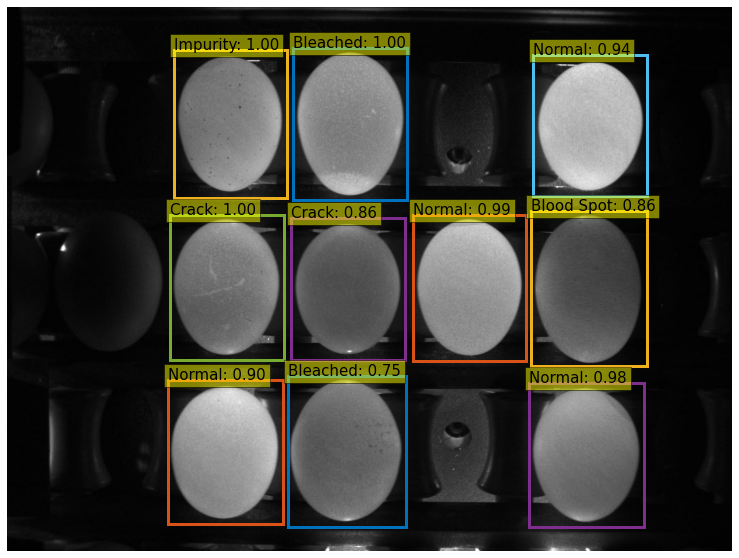

./Final_MONO_Images_Demo/0604095641_1_07683.jpg
<class 'dict'>
Number bounding boxes before:  7
[[1034.2113037109375, 879.3472290039062], [1040.5877685546875, 530.1834106445312], [322.5191650390625, 169.9322509765625], [802.55615234375, 884.1865234375], [564.4340209960938, 530.1661376953125], [315.00921630859375, 533.3577880859375], [311.6881103515625, 884.8146362304688]]
[]
Number bounding boxes after:  7


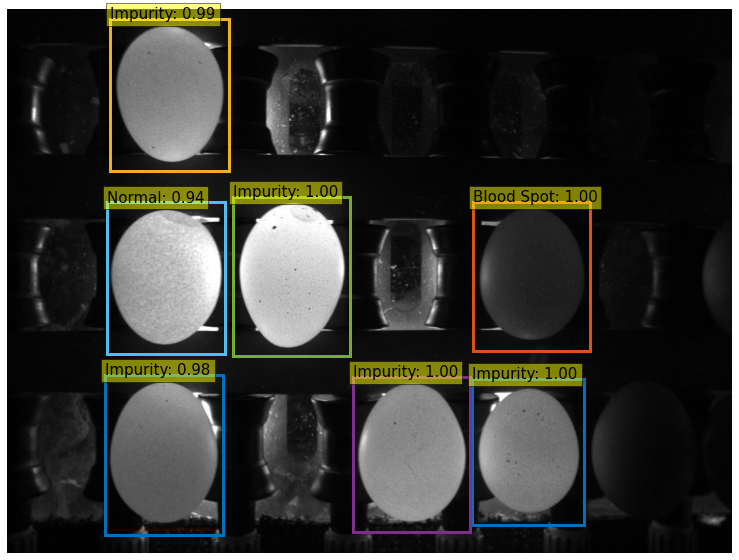

./Final_MONO_Images_Demo/0604094309_0_02212.jpg
<class 'dict'>
Number bounding boxes before:  9
[[765.0538940429688, 227.52285766601562], [282.6306457519531, 887.98291015625], [281.20367431640625, 228.49014282226562], [1004.9432373046875, 559.1134643554688], [521.1478881835938, 560.2500610351562], [521.3597412109375, 889.5833740234375], [765.30078125, 227.44317626953125], [763.13232421875, 894.89111328125], [1005.0511474609375, 558.9010620117188]]
[6, 3]
Number bounding boxes after:  7


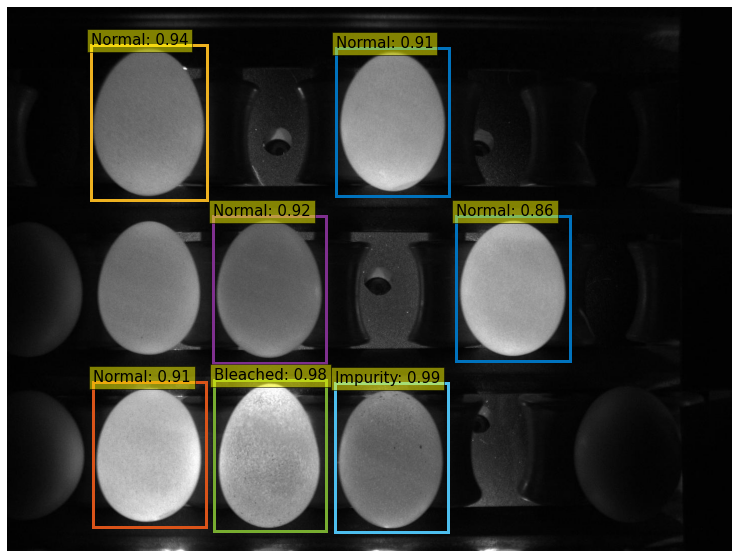

./Final_MONO_Images_Demo/0718115916_0_10037_369.jpg
<class 'dict'>
Number bounding boxes before:  12
[[510.67578125, 226.35044860839844], [992.4948120117188, 888.624267578125], [755.3983154296875, 233.06004333496094], [994.8309326171875, 230.82763671875], [994.4112548828125, 564.24951171875], [509.2429504394531, 888.9710083007812], [263.9610900878906, 239.1085968017578], [751.2152099609375, 888.6939086914062], [508.9456787109375, 560.8148193359375], [267.50775146484375, 891.38671875], [755.145751953125, 566.876708984375], [262.68341064453125, 560.4500732421875]]
[]
Number bounding boxes after:  12


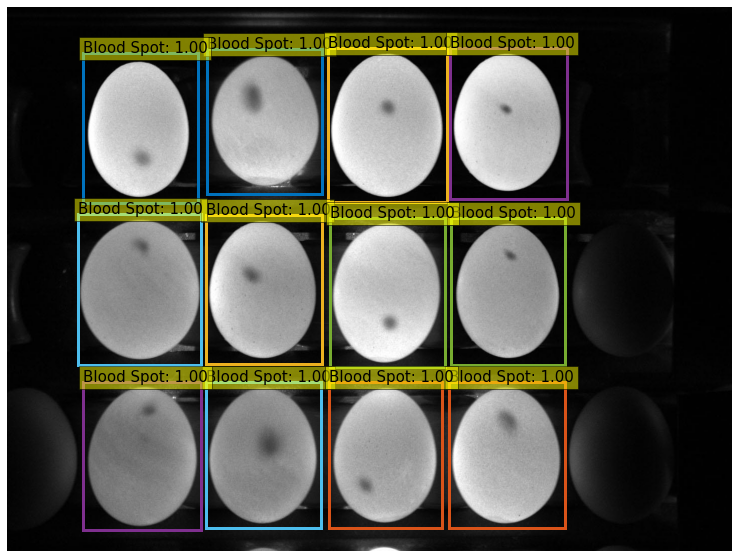

./Final_MONO_Images_Demo/0604094229_1_06726.jpg
<class 'dict'>
Number bounding boxes before:  11
[[569.01025390625, 161.88978576660156], [1038.37744140625, 882.4768676757812], [318.72869873046875, 885.7340087890625], [1045.9371337890625, 528.0570068359375], [802.7505493164062, 524.6625366210938], [802.75244140625, 884.2994384765625], [321.1963195800781, 526.9338989257812], [1046.2869873046875, 527.9114379882812], [319.5898742675781, 166.114013671875], [565.130859375, 522.6300659179688], [1037.544189453125, 882.947998046875]]
[1, 3]
Number bounding boxes after:  9


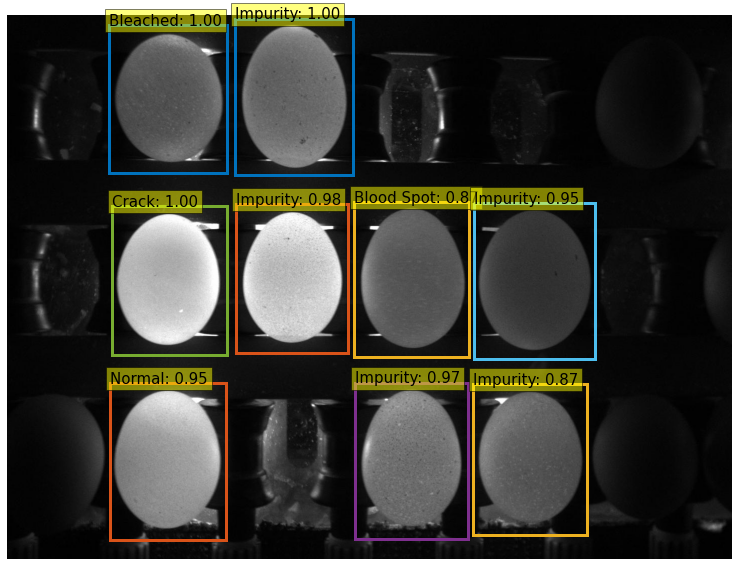

./Final_MONO_Images_Demo/0604092758_0_01066.jpg
<class 'dict'>
Number bounding boxes before:  4
[[761.2188110351562, 893.8009033203125], [1001.68701171875, 891.3914794921875], [283.7897644042969, 226.20799255371094], [761.3275756835938, 894.3800659179688]]
[0]
Number bounding boxes after:  3


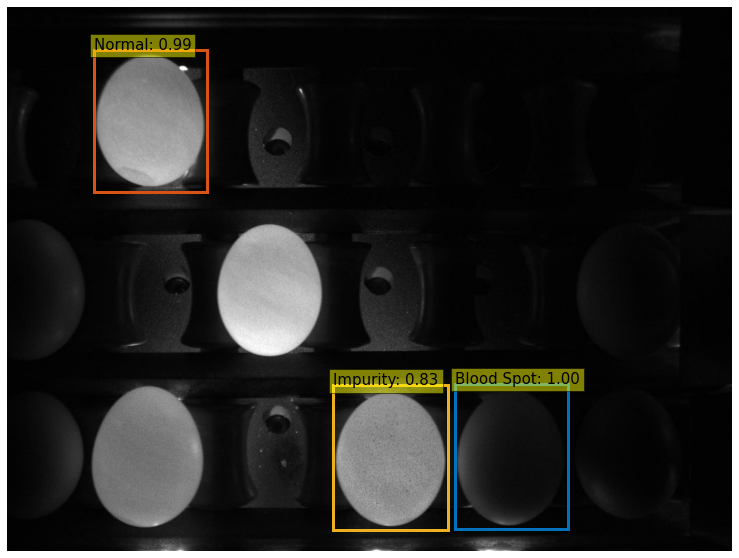

./Final_MONO_Images_Demo/0718115921_0_10044_371.jpg
<class 'dict'>
Number bounding boxes before:  12
[[510.6828918457031, 225.8342742919922], [992.190185546875, 887.738525390625], [752.98291015625, 226.0022735595703], [1001.1107788085938, 223.3845977783203], [998.3613891601562, 559.3788452148438], [509.9759216308594, 890.7283935546875], [269.85125732421875, 227.0210418701172], [753.7839965820312, 891.900146484375], [510.8865966796875, 559.526123046875], [268.43890380859375, 889.66943359375], [755.8394775390625, 555.7005004882812], [266.9755554199219, 559.8160400390625]]
[]
Number bounding boxes after:  12


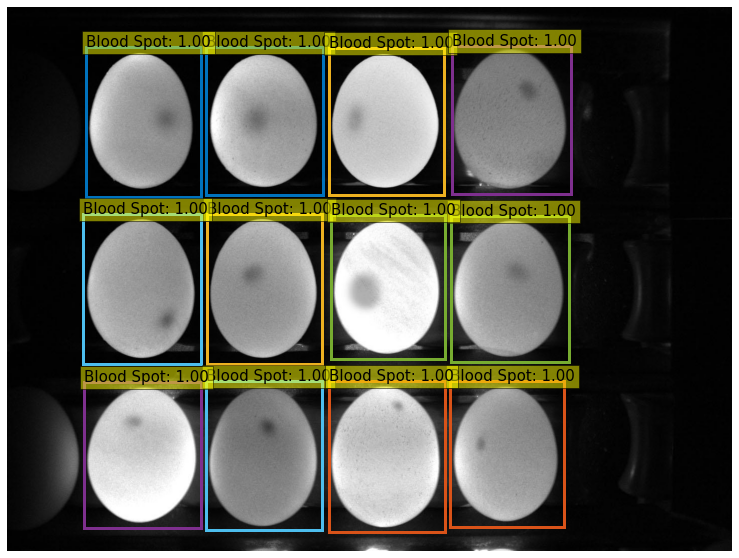

./Final_MONO_Images_Demo/0604093831_0_01862.jpg
<class 'dict'>
Number bounding boxes before:  7
[[524.0599975585938, 235.764404296875], [1008.5308837890625, 571.0089111328125], [522.7881469726562, 571.8668212890625], [522.56201171875, 901.3009033203125], [770.85791015625, 236.2723846435547], [1008.8244018554688, 571.5701904296875], [279.9767761230469, 566.0367431640625]]
[5]
Number bounding boxes after:  6


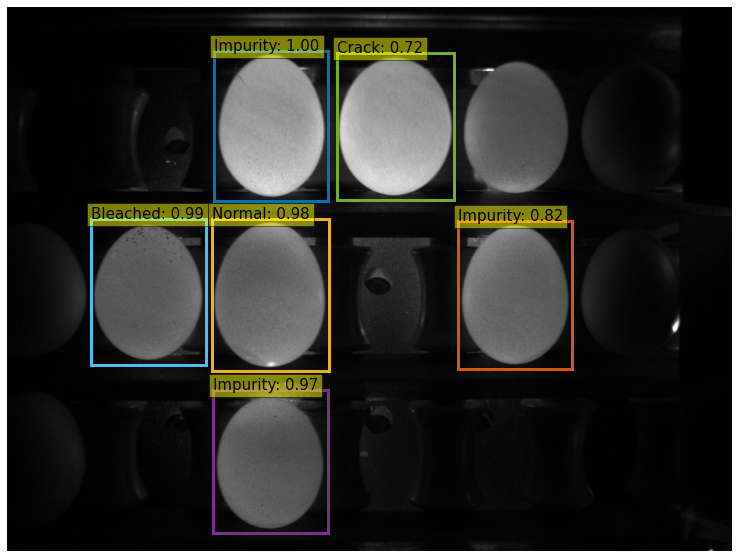

./Final_MONO_Images_Demo/0604093248_1_01430.jpg
<class 'dict'>
Number bounding boxes before:  6
[[681.4615478515625, 877.572265625], [444.6402587890625, 875.6025390625], [686.1027221679688, 548.9358520507812], [681.519287109375, 878.3975830078125], [447.5406188964844, 545.9478759765625], [925.1367797851562, 550.4635009765625]]
[3]
Number bounding boxes after:  5


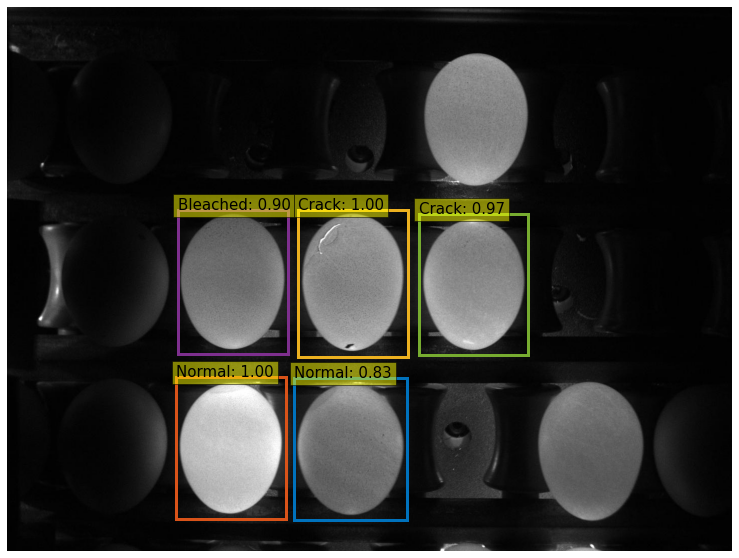

./Final_MONO_Images_Demo/0604095950_0_03471.jpg
<class 'dict'>
Number bounding boxes before:  7
[[517.6986083984375, 894.6868896484375], [760.2623291015625, 891.413818359375], [517.9404907226562, 895.0224609375], [1000.2440185546875, 890.252197265625], [279.2472839355469, 234.87210083007812], [276.1746826171875, 569.30078125], [999.6361083984375, 890.8260498046875]]
[2, 3]
Number bounding boxes after:  5


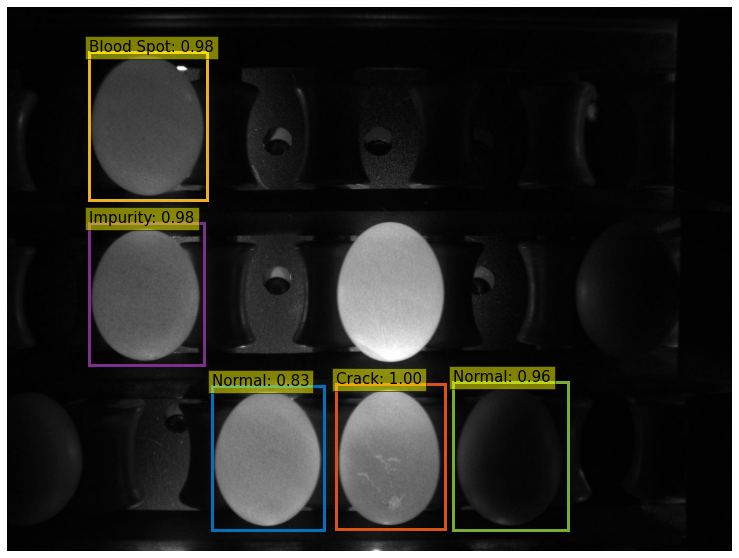

./Final_MONO_Images_Demo/0503114530_0_09553.jpg
<class 'dict'>
Number bounding boxes before:  9
[[765.1328735351562, 892.97705078125], [523.34765625, 890.6595458984375], [524.4130249023438, 890.4146118164062], [767.9412841796875, 562.8187866210938], [528.31640625, 223.7084503173828], [285.4412536621094, 892.9393310546875], [767.483154296875, 563.5994873046875], [766.9755859375, 563.2552490234375], [1004.3101196289062, 885.2259521484375]]
[1, 6, 7, 7]
Number bounding boxes after:  5


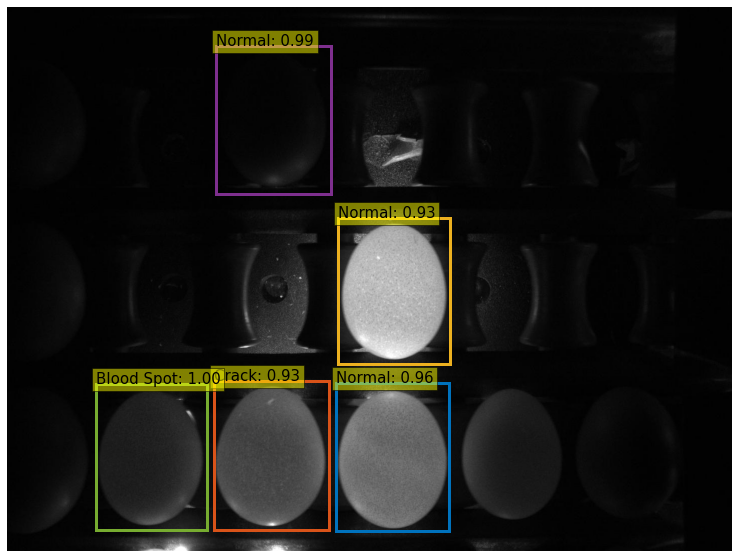

./Final_MONO_Images_Demo/0604092843_1_01121.jpg
<class 'dict'>
Number bounding boxes before:  3
[[1154.63330078125, 564.4537353515625], [676.4939575195312, 562.589111328125], [433.0706787109375, 882.4229736328125]]
[]
Number bounding boxes after:  3


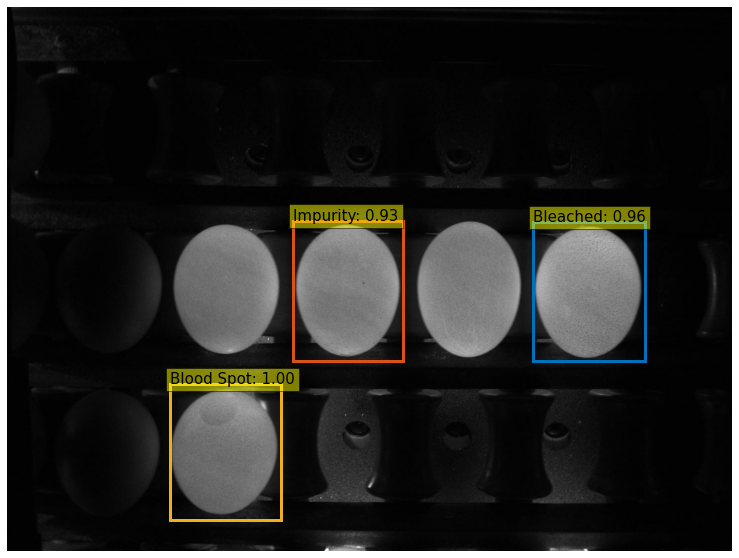

./Final_MONO_Images_Demo/0718115210_0_09501.jpg
<class 'dict'>
Number bounding boxes before:  12
[[513.0955810546875, 895.8958740234375], [757.39111328125, 224.15235900878906], [270.089599609375, 897.9305419921875], [273.60650634765625, 230.84344482421875], [754.2714233398438, 893.1314697265625], [1000.62744140625, 228.44252014160156], [513.6607055664062, 560.6976928710938], [756.3451538085938, 561.9619140625], [513.2445678710938, 224.62306213378906], [998.3975830078125, 563.23046875], [267.59271240234375, 561.7086791992188], [994.5299072265625, 894.8138427734375]]
[]
Number bounding boxes after:  12


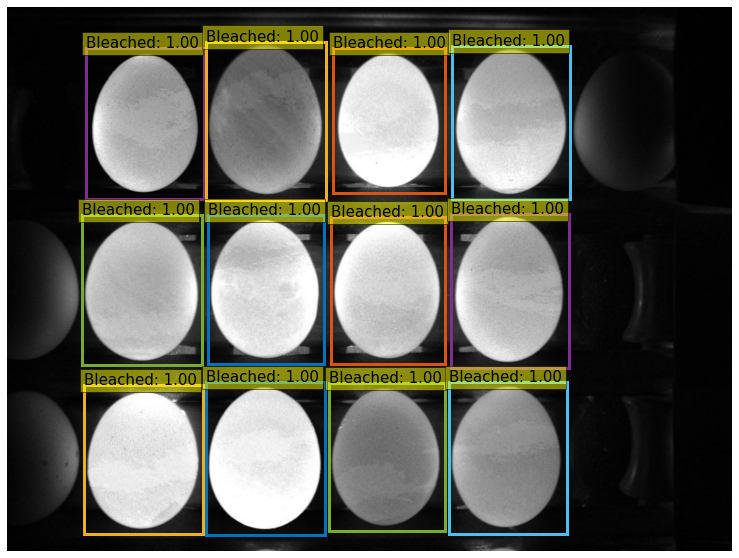

./Final_MONO_Images_Demo/0503114501_0_09517.jpg
<class 'dict'>
Number bounding boxes before:  6
[[522.58056640625, 900.3089599609375], [525.7097778320312, 567.580810546875], [523.3593139648438, 900.4857177734375], [287.6476745605469, 234.9452667236328], [524.764892578125, 567.7676391601562], [282.792724609375, 564.8907470703125]]
[0, 1]
Number bounding boxes after:  4


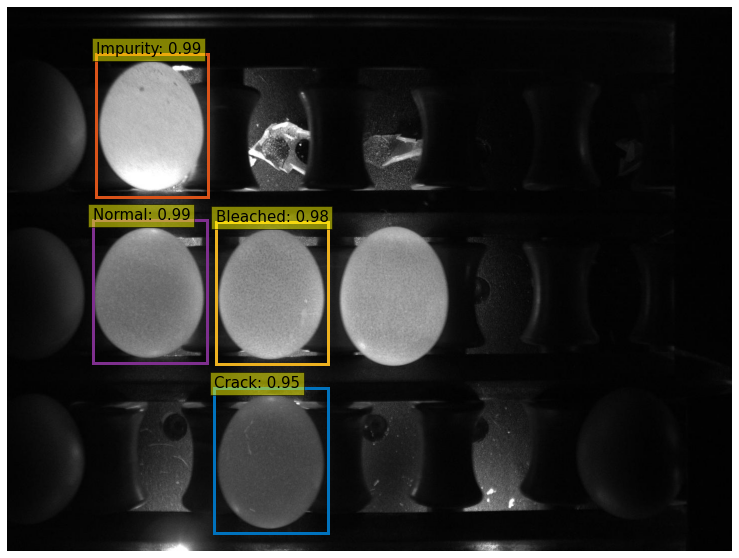

./Final_MONO_Images_Demo/0604091312_1_04689.jpg
<class 'dict'>
Number bounding boxes before:  11
[[565.4649047851562, 882.5091552734375], [1040.015380859375, 879.56396484375], [1043.0595703125, 524.5230712890625], [321.57183837890625, 885.5538330078125], [565.168212890625, 882.797607421875], [802.8671264648438, 879.5275268554688], [323.01214599609375, 884.490234375], [1043.0042724609375, 523.683349609375], [321.61029052734375, 522.8284912109375], [805.1511840820312, 522.1690063476562], [321.2478332519531, 520.9368896484375]]
[4, 7, 6, 10]
Number bounding boxes after:  7


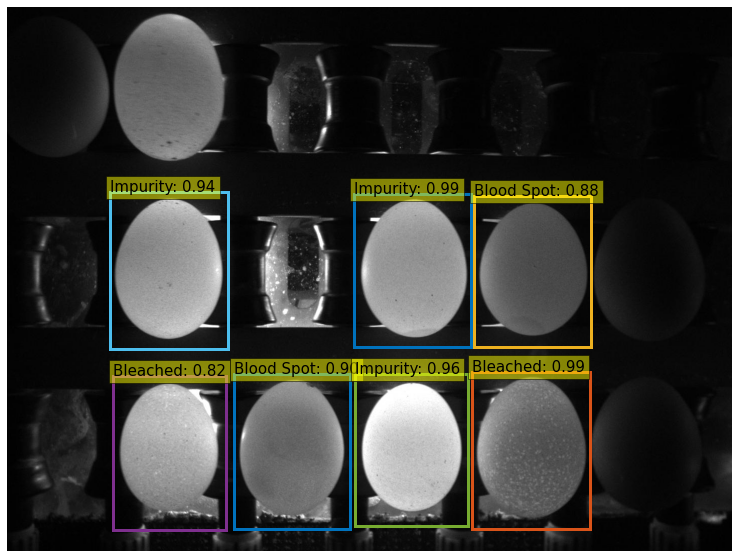

In [42]:
DIR_TEST = './Final_MONO_Images_Demo/'
test_images = collect_all_images(DIR_TEST)

count = 0

for image in test_images:
    if (count == 30):
        break
    #Print out the image name
    print(image)
    img = Image.open(image)

    scores, boxes = detect(img, model, transform)
    print('Number bounding boxes before: ', len(boxes))
    scores_1, boxes_1 = Select_Bounding_Boxes(scores, boxes)
    print('Number bounding boxes after: ', len(boxes_1))
    plot_results(image, scores_1, boxes_1)
    count += 1

Compute mAP for the Test Dataset - MONO Dataset with 6 classes

In [14]:
# Move the evaluation file for COLOR and rename file
# Prepare COLOR evaluation file outside and move it to the directory datasets/coco_eval.py
# Delete the original coco_eval.py file
!mv ./datasets/coco_eval.py ./datasets/coco_eval_original.py
!cp -r ./coco_eval_mono.py ./datasets/
!mv ./datasets/coco_eval_mono.py ./datasets/coco_eval.py


In [ ]:
from datasets import build_dataset, get_coco_api_from_dataset
from engine import evaluate
from torch.utils.data import DataLoader
import util.misc as utils

dataset_test = build_dataset(image_set='test', args=args)
sampler_test = torch.utils.data.SequentialSampler(dataset_test)

data_loader_test = DataLoader(dataset_test, args.batch_size, sampler=sampler_test,
                                 drop_last=False, collate_fn=utils.collate_fn, num_workers=2)


# Evaluate
model = model.to(args.device)
base_ds = get_coco_api_from_dataset(dataset_test)


test_stats, coco_evaluator = evaluate(model, criterion, postprocessors, data_loader_test, base_ds, args.device, args.output_dir)